In [2]:
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, io, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
import matplotlib.pyplot as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

0.21.0


In [4]:
im = Image.open("../Images/parrot.png") # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


In [5]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('../Images/parrot_gray.png') # save the image to disk
Image.open("../Images/parrot_gray.png").show() # read the grayscale image from disk and show

(960, 1280, 4) float32 <class 'numpy.ndarray'>


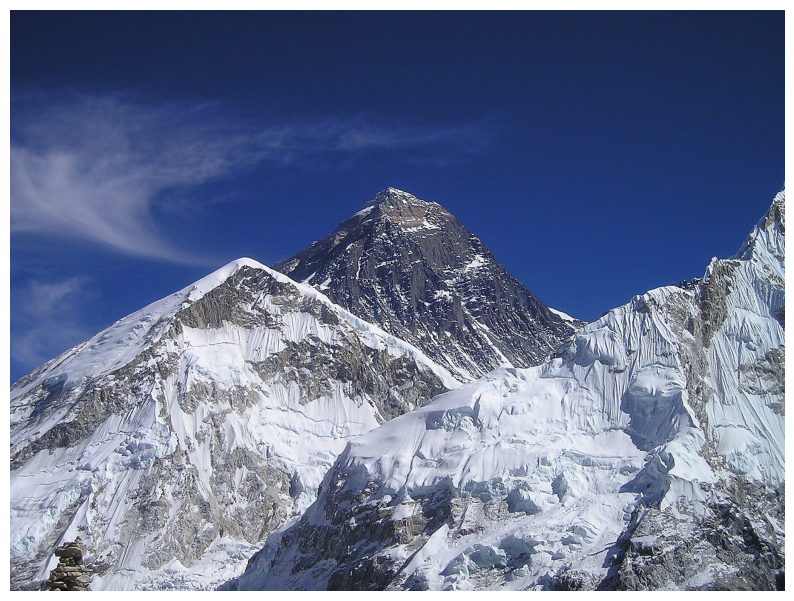

In [26]:
im = mpimg.imread("../Images/hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

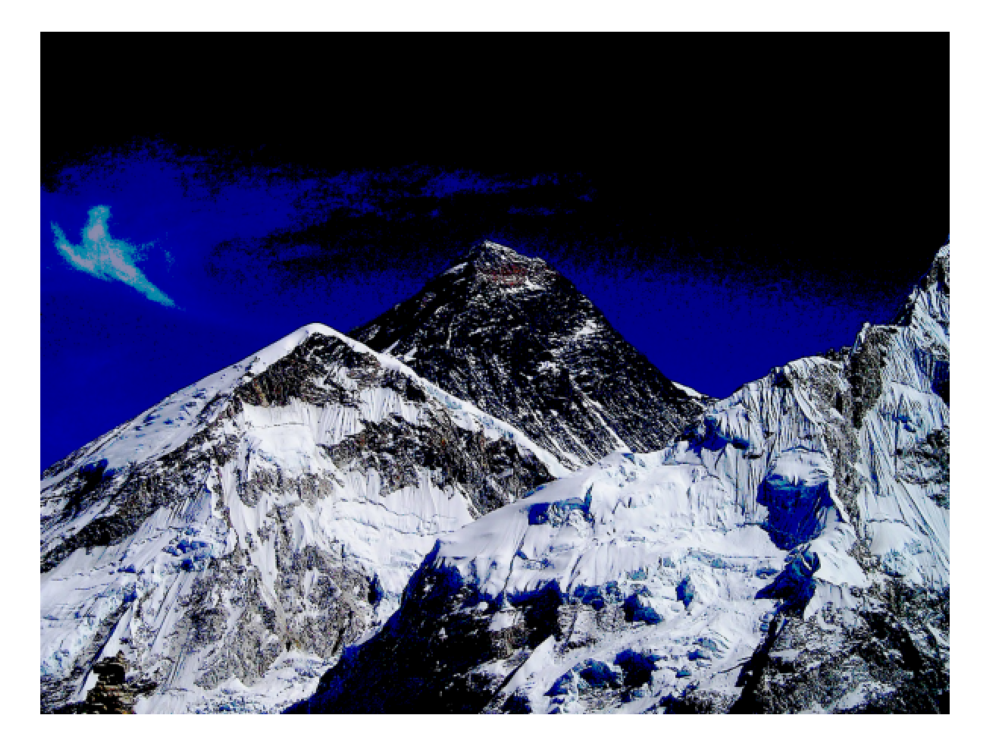

In [7]:
im1 = im
im1[im1 < 0.5] = 0 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("../Images/hill_dark.png") # save the dark image
plt.close()
im = mpimg.imread("../Images/hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

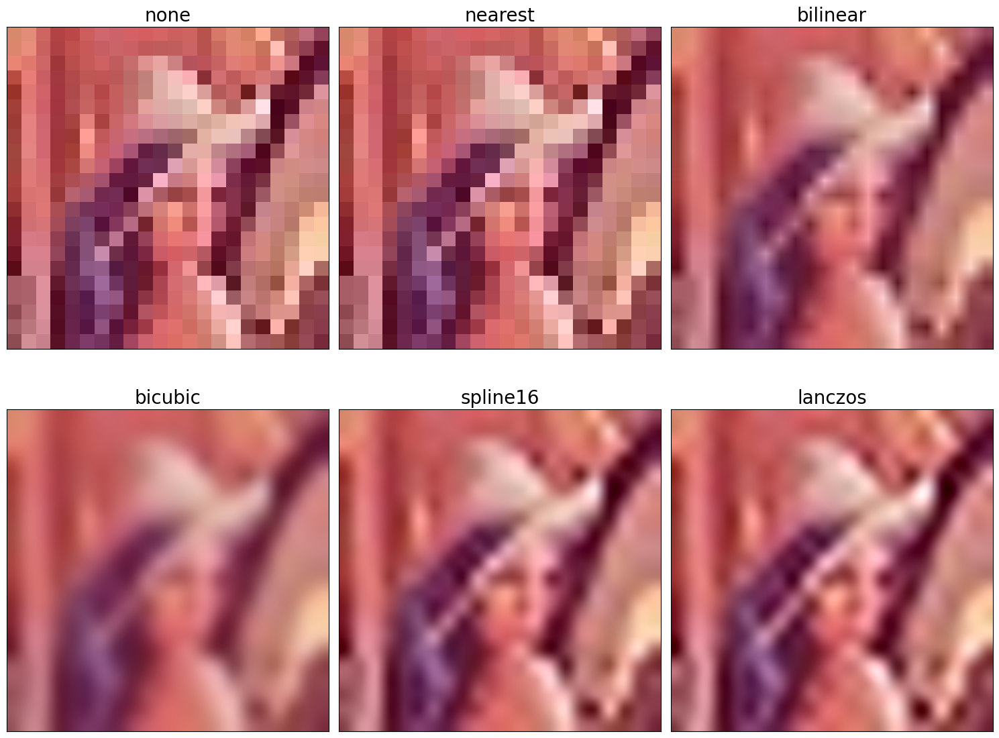

In [8]:
im = mpimg.imread("../Images/lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

Original Image: Shape - (340, 453, 3), Dtype - uint8, Type - <class 'numpy.ndarray'>
Image saved successfully.


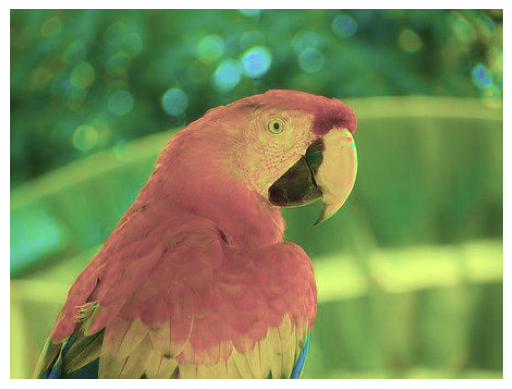

In [9]:
# Read the image from disk (provide the correct path)
im = io.imread("../Images/parrot.png")

# Check image properties
print("Original Image: Shape - {}, Dtype - {}, Type - {}".format(im.shape, im.dtype, type(im)))

# Convert the image to the HSV color space
hsv = color.rgb2hsv(im)

# Modify the saturation channel (e.g., reduce saturation to 0.5)
hsv[:, :, 1] = 0.5

# Convert the image back to RGB from HSV
im1 = color.hsv2rgb(hsv)

# Save the modified image to disk (provide the correct path)
try:
    # Convert the image to 8-bit format (uint8) before saving with PIL
    im1 = (im1 * 255).astype('uint8')
    pil_image = Image.fromarray(im1)
    pil_image.save('../Images/parrot_hsv.png')
    print("Image saved successfully.")
except Exception as e:
    print("Error saving the image:", e)

# Read and display the saved image
try:
    im = io.imread("../Images/parrot_hsv.png")
    plt.axis('off')
    plt.imshow(im)
    plt.show()
except Exception as e:
    print("Error reading and displaying the saved image:", e)

In [11]:
viewer.ImageViewer(im).show()

NameError: name 'viewer' is not defined

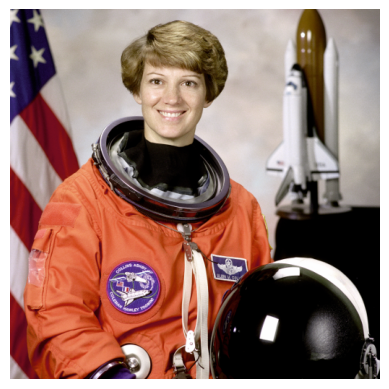

In [27]:
im = data.astronaut()
plt.imshow(im)
plt.axis('off')
plt.show()

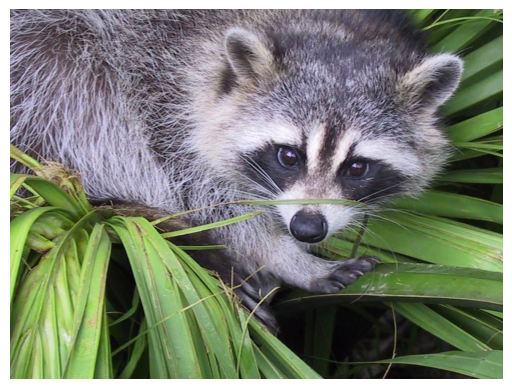

In [17]:
pil_image = Image.fromarray(im)

# Save the image using Pillow
pil_image.save('../Images/face.png')

# Display the saved image using Matplotlib
plt.imshow(im)
plt.axis('off')
plt.show()

In [21]:
im = imread('../Images/pepper.jpg')
pil_image = Image.fromarray(im)

# Display the saved image using Matplotlib
print(type(im), im.shape, im.dtype)
# <class 'numpy.ndarray'> (225, 225, 3) uint8

<class 'numpy.ndarray'> (225, 225, 3) uint8


<class 'numpy.ndarray'> (225, 225, 3) uint8


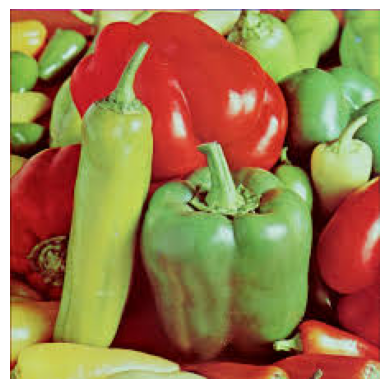

(<matplotlib.image.AxesImage at 0x22621f71210>,
 (-0.5, 224.5, 224.5, -0.5),
 None)

In [23]:
import imageio.v2 as imageio
im = imageio.imread('../Images/pepper.jpg')
print(type(im), im.shape, im.dtype)
plt.imshow(im), plt.axis('off'), plt.show()

RGB


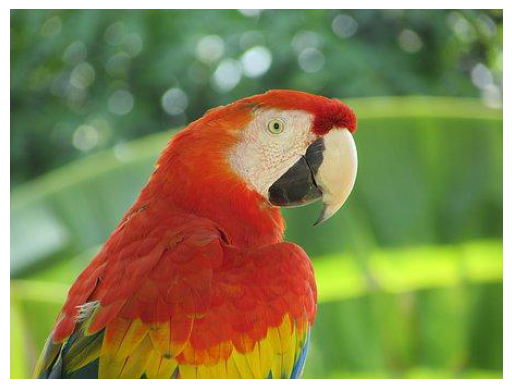

In [31]:
im = Image.open("../Images/parrot.png")
print(im.mode)
im.save("../Images/parrot.jpg")
plt.imshow(im)
plt.axis('off')
plt.show()

RGBA


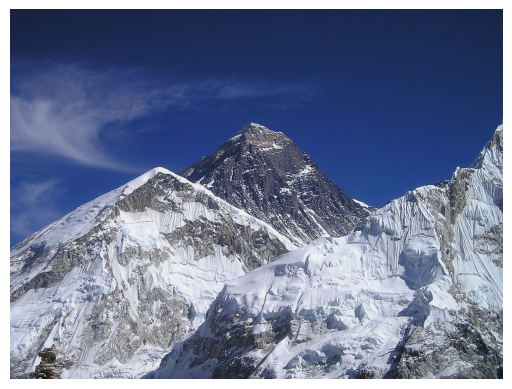

In [30]:
im = Image.open("../Images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("../Images/hill.jpg") # first convert to RGB mode
plt.imshow(im)
plt.axis('off')
plt.show()

(340, 453)


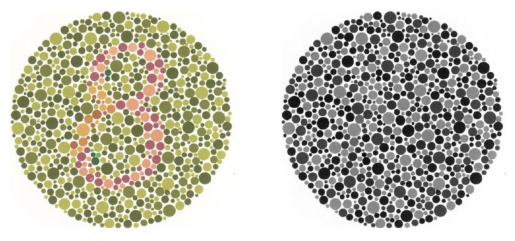

In [27]:
im = imread("../Images/parrot.png", as_gray=True)
print(im.shape)
im = imread("../Images/Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

<Figure size 640x480 with 0 Axes>

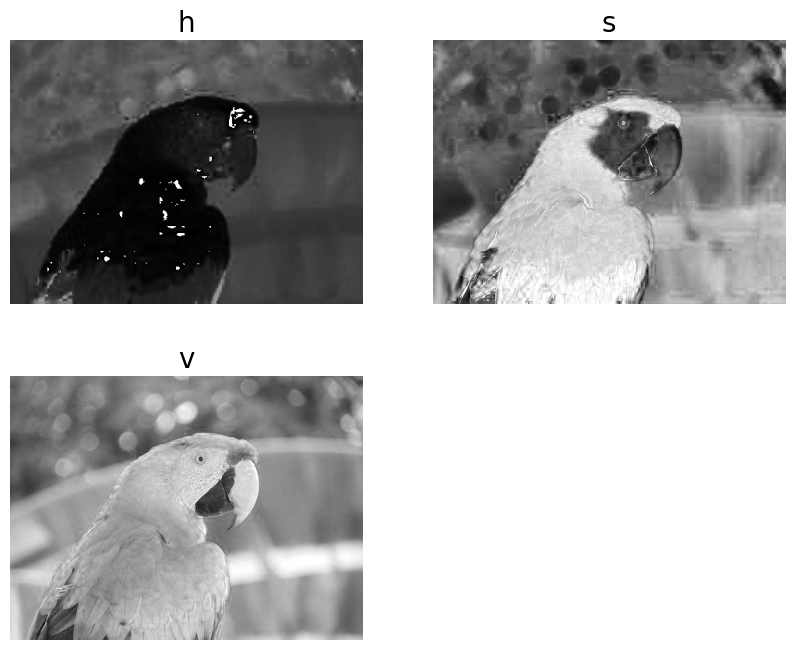

In [28]:
im = imread("../Images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

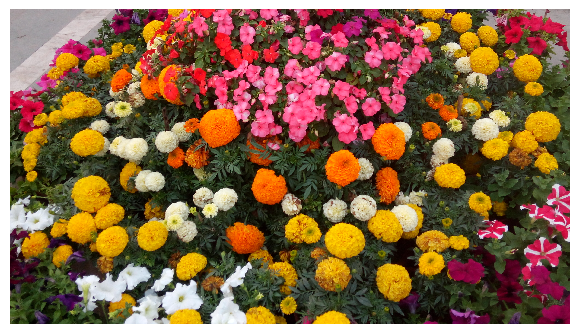

((-0.5, 4095.5, 2303.5, -0.5), None)

In [30]:
im = Image.open('../Images/flowers.png') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
imshow(im) # use skimage imshow to display the image
plt.axis('off'), show()

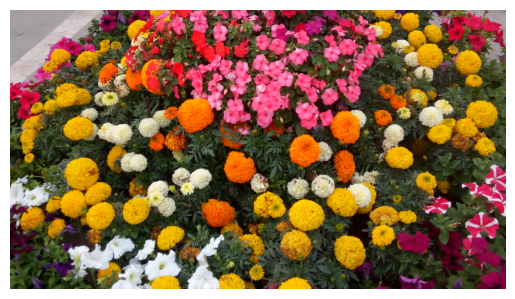

In [33]:
im = imread('../Images/flowers.png') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
# display the image with PIL Image.show() method
plt.imshow(im)
plt.axis('off')
plt.show()

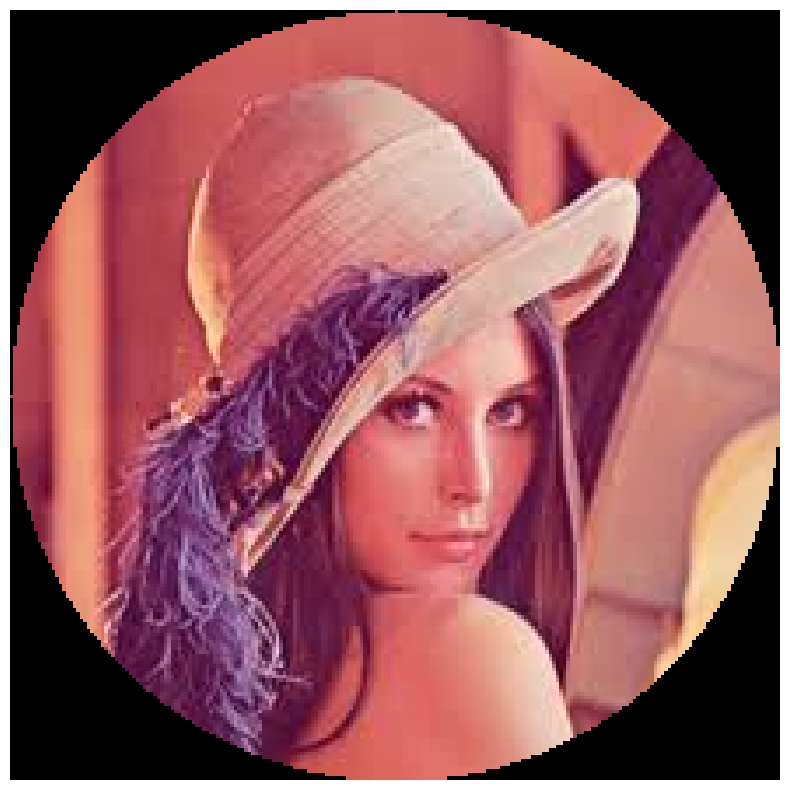

In [6]:
# Read the Lena image from skimage data
lena = io.imread("../Images/lena.jpg")

# Convert the image to grayscale
lena_gray = color.rgb2gray(lena)

# Create a copy of the Lena image
modified_lena = lena.copy()

# Define a mask to zero out some pixels (e.g., a circular mask)
lx, ly = lena.shape[0], lena.shape[1]
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4

# Apply the mask to the copied image
modified_lena[mask, :] = 0  # Set the selected pixels to zero

# Display the modified image
plt.figure(figsize=(10, 10))
plt.imshow(modified_lena, cmap='gray')  # Use cmap='gray' for grayscale images
plt.axis('off')
plt.show()

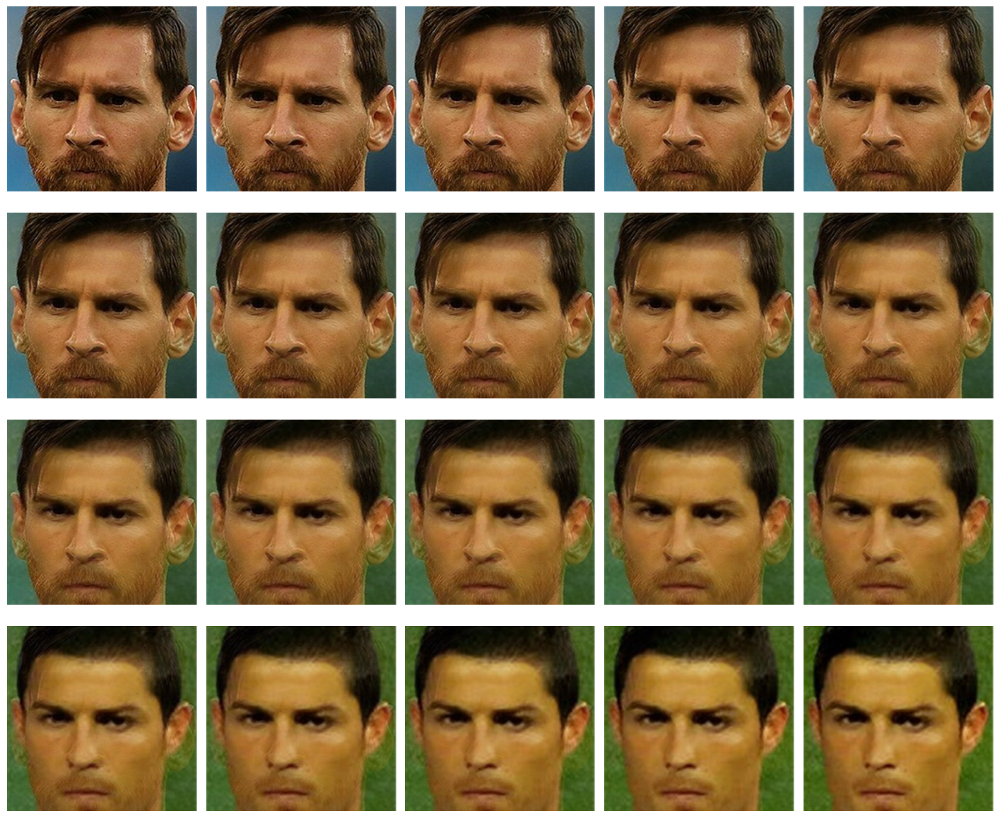

In [7]:
im1 = mpimg.imread("../Images/messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("../Images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [35]:
im = Image.open("../Images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format

453 340 RGB PNG


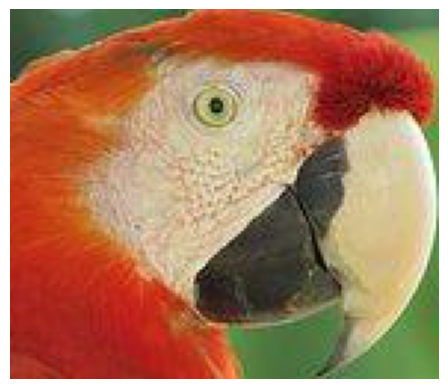

In [36]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
plt.imshow(im_c)
plt.axis('off')
plt.show()

107 105


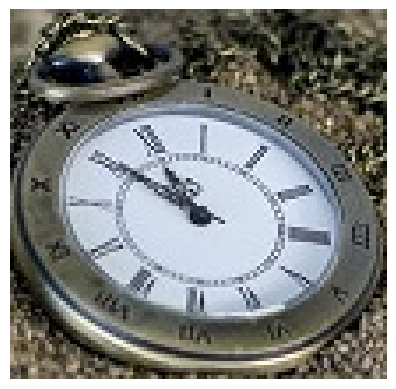

In [37]:
im = Image.open("../Images/clock.jpg")
print(im.width, im.height)
plt.imshow(im)
plt.axis('off')
plt.show()

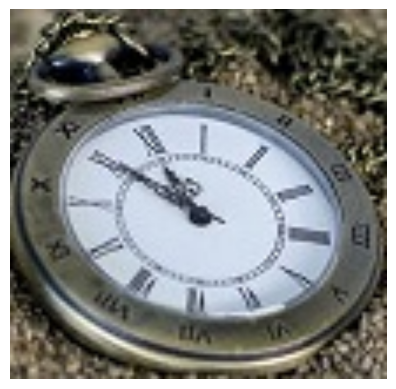

In [38]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation
plt.imshow(im_large)
plt.axis('off')
plt.show()

720 540


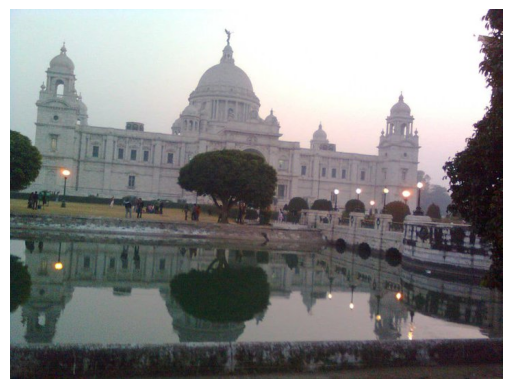

In [39]:
im = Image.open("../Images/victoria_memorial.png")
print(im.width, im.height)
plt.imshow(im)
plt.axis('off')
plt.show()

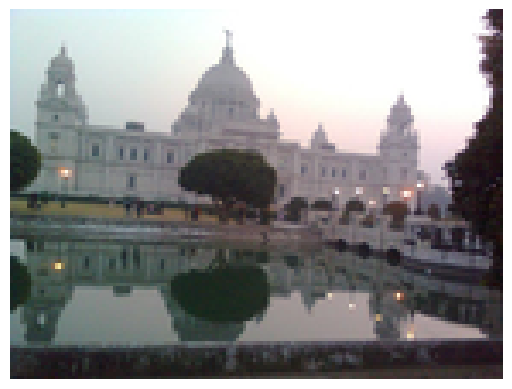

In [40]:
im_small = im.resize((im.width//5, im.height//5), Image.LANCZOS)
plt.imshow(im_small)
plt.axis('off')
plt.show()

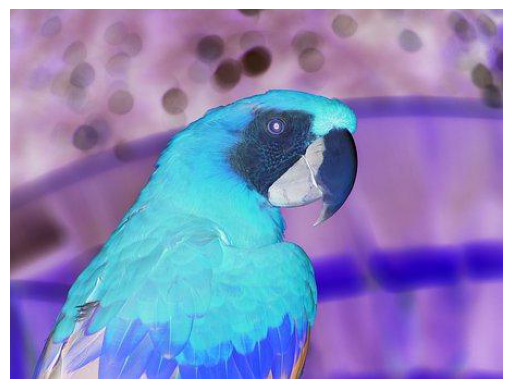

In [41]:
im = Image.open("../Images/parrot.png")
im_t = im.point(lambda x: 255 - x)
plt.imshow(im_t)
plt.axis('off')
plt.show()

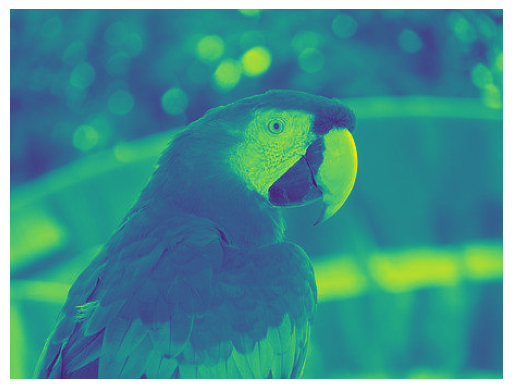

In [42]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
plt.imshow(im_g)
plt.axis('off')
plt.show()

In [47]:
im_g.point(lambda x: 255*np.log(1+x/255)).show()

In [48]:
im_g.point(lambda x: 255*(x/255)**0.6).show()

In [49]:
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis

In [50]:
im = Image.open("../Images/parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear

In [51]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params,
Image.BICUBIC)
im1.show()

In [53]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

In [54]:
im = Image.open("../Images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

In [55]:
im = Image.open("../Images/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Welcome to image processing with python", font=font)
del draw
im.show()

In [56]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 255)]
[154020, 154020, 154020]
[127.7817880794702, 126.23926113491754, 70.78939748084665]
[120, 129, 63]
[49.19357687954951, 53.00205041616655, 44.16391918154021]


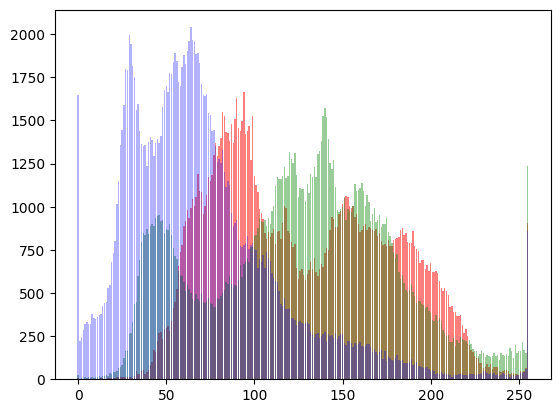

In [57]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

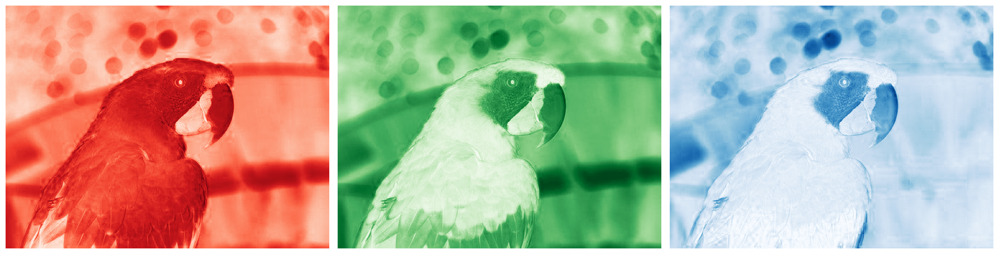

In [58]:
im = Image.open("../Images/parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

In [ ]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()